In [ ]:
from google.colab import drive
drive.mount('/gdrive', force_remount=True)

Mounted at /gdrive


#VGG16으로 분류
별도의 학습 없이 기존 모델을 통하여 분류한다.

##분류 실행
미리 학습된 VGG16 모델을 사용하여 분류한다.



In [ ]:
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.applications import vgg16
from IPython.display import display # 이미지 출력 함수
import numpy as np



def predict_vgg16(model, filename) :

  # 이미지 파일을 읽고 화면에 표시
  image = load_img(filename)
  # image = PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=688x550
  display(image)

  
  # 모델 사이즈로 이미지 파일을 읽기
  image = load_img(filename, target_size=(224, 224))
  # image = PIL.Image.Image image mode=RGB size=224x224

  
  # 이미지 데이터를 numpy로 변환, keras preprocessing에 있음
  image = img_to_array(image)
  # print(image) # 추가
  # print(image.shape) # 추가
  # [
  #   [[211. 184. 163.]
  #   [225. 193. 170.]
  #   ...
  #   [237. 202. 180.]]
  #   ...
  # ]  
  #
  # image.shape = (224, 224, 3) 224x224x3?

  # vgg16.preprocess_input()을 호출하기 위해 차원을 조정
  # 보통 모델을 여러 이미지를 한번에 호출. 
  # 맨 앞의 1 : 이미지 갯수가 1개라는 것.
  # 두번째 224 : 가로
  # 세번째 224 : 세로
  # 네번째 3 : R, G, B 3개
  image = image.reshape((1, 224, 224, 3))

  # VGG16 모델 호출을 위해 데이터 전처리.
  # -255 ~ 255 사이 값으로 정규화한다.
  # 그리고 RGB를 BGR순으로 바꾼다.
  image = vgg16.preprocess_input(image)
  
  
  # 이미지를 모델에 적용
  yhat = model.predict(image)
  # yhat = [[2.03485320e-06 4.21382174e-06 1.45730738e-07 1.04057870e-06
  #          6.61934010e-08 2.63145339e-04 4.49358195e-05 2.03222541e-08
  #          ... ]] # 1000개 클래스에 대한 결과값.
  #
    
    
  # 모델 적용된 결과를 파싱
  label = vgg16.decode_predictions(yhat)
  # label = [[('n02655020', 'puffer', 0.9612253), ... ]]

  # 가장 확률이 높은 결과를 획득
  label = label[0][0]
  # label = ('n02655020', 'puffer', 0.9612253)

  # 라벨과 라벨을 예측한 확률을 출력
  print('%s (%.2f%%)' % (label[1], label[2]*100))    

    

    


## 커스텀 데이터 업로드
zip, tar 파일일 경우 사용하는 코드

이건 zip 파일 할대 쓰기. 지금은 기존 업로드 폴더로 실행.

In [ ]:
# # 기존 폴더 있으면 삭제
# !rm -rf images

# # 압축 파일을 풀기
# !unzip '/gdrive/My Drive/Colab Notebooks/11/소스코드(ipynb)/images.zip' -d  '/gdrive/My Drive/Colab Notebooks/11/소스코드(ipynb)'

# !ls -al

## 커스텀 데이타의 분류 실행


553467904/553467096 [==============================] - 4s 0us/step
Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
____________________________________________________________

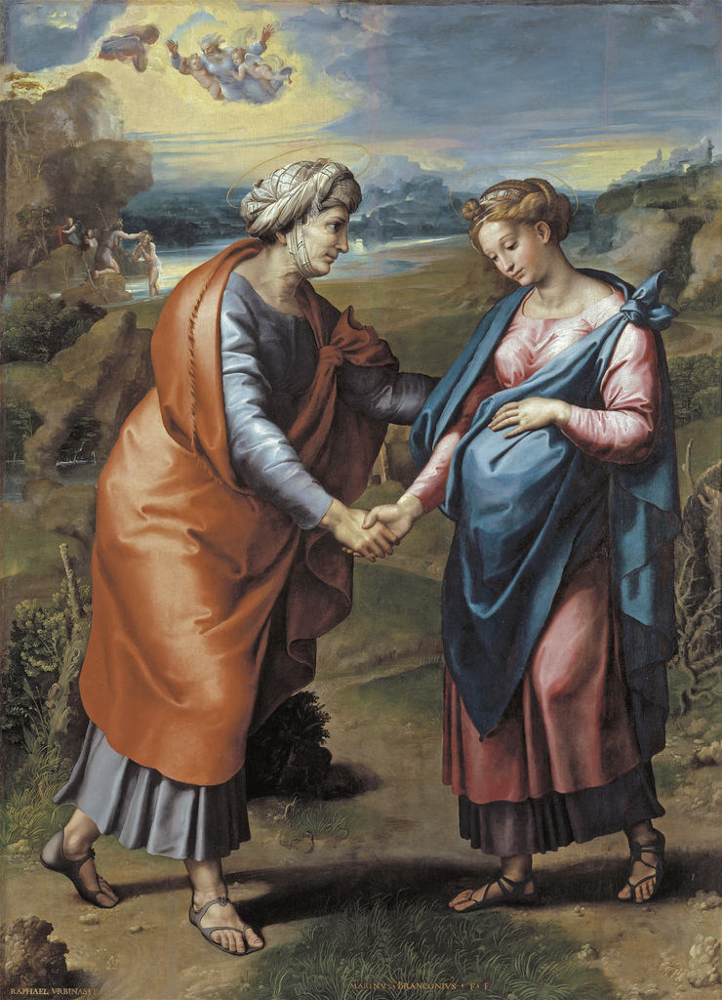

40960/35363 [==================================] - 0s 0us/step
boa_constrictor (4.00%)


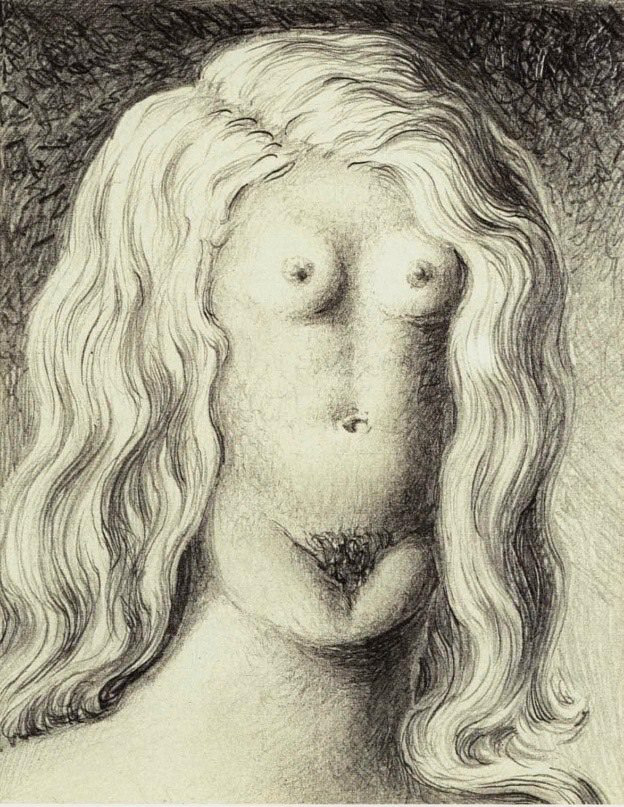

wig (41.73%)


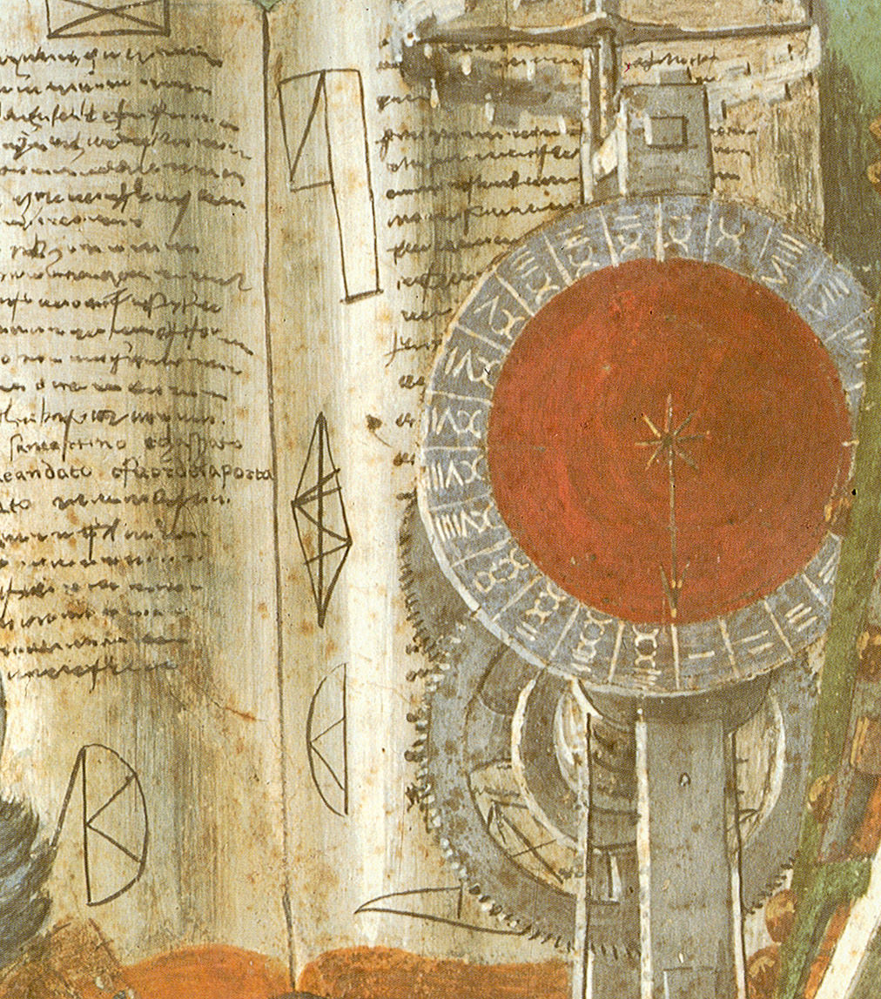

church (18.90%)


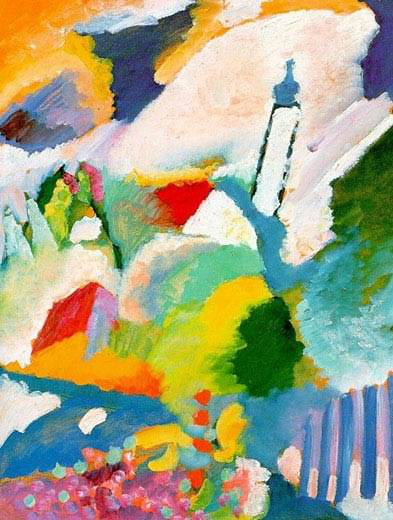

quilt (52.60%)


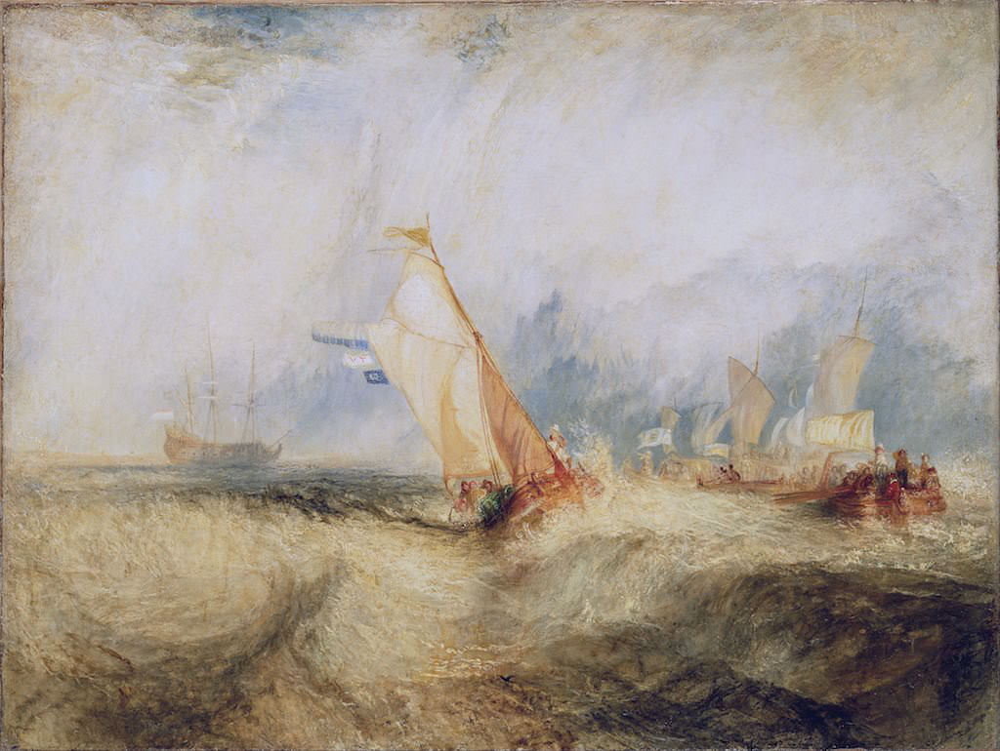

geyser (18.26%)


In [ ]:
from keras.applications import vgg16

# VGG16 모델 불러오기
model = vgg16.VGG16()

# 모델의 모양을 보여준다.
model.summary()

# 테스트 할 이미지 파일들
files = [
    '/gdrive/My Drive/Colab Notebooks/11/소스코드(ipynb)/artist_image/test/Raphael/Raphael_100.jpg',
     '/gdrive/My Drive/Colab Notebooks/11/소스코드(ipynb)/artist_image/test/Rene_Magritte/Rene_Magritte_175.jpg',
     '/gdrive/My Drive/Colab Notebooks/11/소스코드(ipynb)/artist_image/test/Sandro_Botticelli/Sandro_Botticelli_145.jpg',
     '/gdrive/My Drive/Colab Notebooks/11/소스코드(ipynb)/artist_image/test/Vasiliy_Kandinskiy/Vasiliy_Kandinskiy_69.jpg',
     '/gdrive/My Drive/Colab Notebooks/11/소스코드(ipynb)/artist_image/test/William_Turner/William_Turner_57.jpg'
    ]

# 분류 실행
for file in files :
  predict_vgg16(model, file)  

# 커스텀 데이터로 학습



## 데이터 로더 준비

Keras에서 제공하는 ImageDataGenerator를 사용한다.

적은 수의 데이터를 커버하기 위하여 데이터 증강을 한다.


### V 데이터 증강 X

In [ ]:
from keras.preprocessing.image import ImageDataGenerator

train_dir = '/gdrive/My Drive/Colab Notebooks/11/소스코드(ipynb)/artist_image/train'
validation_dir = '/gdrive/My Drive/Colab Notebooks/11/소스코드(ipynb)/artist_image/test'
batch_size = 32
image_size = 224

# 학습에 사용될 이미지 데이터 생성기
train_datagen = ImageDataGenerator()
 
# 검증에 사용될 이미지 데이터 생성기
validation_datagen = ImageDataGenerator()
 

# 학습에 사용될 데이터 생성기  
train_generator = train_datagen.flow_from_directory(
        train_dir)

# 검증에 사용될 데이터 생성기
validation_generator = validation_datagen.flow_from_directory(
        validation_dir)

class_num=len(train_generator.class_indices)

custom_labels = list(validation_generator.class_indices.keys())

Found 531 images belonging to 5 classes.
Found 90 images belonging to 5 classes.


### V 데이터 증강 (기본)

In [ ]:
from keras.preprocessing.image import ImageDataGenerator

train_dir = '/gdrive/My Drive/Colab Notebooks/11/소스코드(ipynb)/artist_image/train'
validation_dir = '/gdrive/My Drive/Colab Notebooks/11/소스코드(ipynb)/artist_image/test'
batch_size = 32
image_size = 224

# 학습에 사용될 이미지 데이터 생성기
train_datagen = ImageDataGenerator(
      rotation_range=180, # 회전 최대 20도
      width_shift_range=0.2, # 좌우 이동
      height_shift_range=0.2, # 상하 이동
      horizontal_flip=True, # 좌우 반전
      vertical_flip=True, # 상하 반전
      )
 
# 검증에 사용될 이미지 데이터 생성기
validation_datagen = ImageDataGenerator()
 

# 학습에 사용될 데이터 생성기  
train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(image_size, image_size),
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=True)

# 검증에 사용될 데이터 생성기
validation_generator = validation_datagen.flow_from_directory(
        validation_dir,
        target_size=(image_size, image_size),
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=False)

class_num=len(train_generator.class_indices)

custom_labels = list(validation_generator.class_indices.keys())

Found 531 images belonging to 5 classes.
Found 90 images belonging to 5 classes.


### V 데이터 cutout

In [ ]:
import numpy as np


def get_random_eraser(p=0.5, s_l=0.02, s_h=0.4, r_1=0.3, r_2=1/0.3, v_l=0, v_h=255, pixel_level=False):
    def eraser(input_img):
        if input_img.ndim == 3:
            img_h, img_w, img_c = input_img.shape
        elif input_img.ndim == 2:
            img_h, img_w = input_img.shape

        p_1 = np.random.rand()

        if p_1 > p:
            return input_img

        while True:
            s = np.random.uniform(s_l, s_h) * img_h * img_w
            r = np.random.uniform(r_1, r_2)
            w = int(np.sqrt(s / r))
            h = int(np.sqrt(s * r))
            left = np.random.randint(0, img_w)
            top = np.random.randint(0, img_h)

            if left + w <= img_w and top + h <= img_h:
                break

        if pixel_level:
            if input_img.ndim == 3:
                c = np.random.uniform(v_l, v_h, (h, w, img_c))
            if input_img.ndim == 2:
                c = np.random.uniform(v_l, v_h, (h, w))
        else:
            c = np.random.uniform(v_l, v_h)

        input_img[top:top + h, left:left + w] = c

        return input_img

    return eraser

In [ ]:
from keras.preprocessing.image import ImageDataGenerator

train_dir = '/gdrive/My Drive/Colab Notebooks/11/소스코드(ipynb)/artist_image/train'
validation_dir = '/gdrive/My Drive/Colab Notebooks/11/소스코드(ipynb)/artist_image/test'
batch_size = 32
image_size = 224

# 학습에 사용될 이미지 데이터 생성기
train_datagen = ImageDataGenerator(
      rotation_range=180, # 회전 쵀대 20도
      width_shift_range=0.2, # 좌우 이동
      height_shift_range=0.2, # 상하 이동
      horizontal_flip=True, # 좌우 반전
      vertical_flip=True, # 상하 반전
      preprocessing_function=get_random_eraser(v_l=0, v_h=1)
      )
 
# 검증에 사용될 이미지 데이터 생성기
validation_datagen = ImageDataGenerator()
 

# 학습에 사용될 데이터 생성기  
train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(image_size, image_size),
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=True)

# 검증에 사용될 데이터 생성기
validation_generator = validation_datagen.flow_from_directory(
        validation_dir,
        target_size=(image_size, image_size),
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=False)

class_num=len(train_generator.class_indices)

custom_labels = list(validation_generator.class_indices.keys())

Found 531 images belonging to 5 classes.
Found 90 images belonging to 5 classes.


### O 데이터 mixup  :다시 확인해보기
train-> training 읋 변경 했음


In [ ]:
import numpy as np


class MixupGenerator():
    def __init__(self, X_train, y_train, batch_size=32, alpha=0.2, shuffle=True, datagen=None):
        self.X_train = X_train
        self.y_train = y_train
        self.batch_size = batch_size
        self.alpha = alpha
        self.shuffle = shuffle
        self.sample_num = len(X_train)
        self.datagen = datagen

    def __call__(self):
        while True:
            indexes = self.__get_exploration_order()
            itr_num = int(len(indexes) // (self.batch_size * 2))

            for i in range(itr_num):
                batch_ids = indexes[i * self.batch_size * 2:(i + 1) * self.batch_size * 2]
                X, y = self.__data_generation(batch_ids)

                yield X, y

    def __get_exploration_order(self):
        indexes = np.arange(self.sample_num)

        if self.shuffle:
            np.random.shuffle(indexes)

        return indexes

    def __data_generation(self, batch_ids):
        _, h, w, c = self.X_train.shape
        l = np.random.beta(self.alpha, self.alpha, self.batch_size)
        X_l = l.reshape(self.batch_size, 1, 1, 1)
        y_l = l.reshape(self.batch_size, 1)

        X1 = self.X_train[batch_ids[:self.batch_size]]
        X2 = self.X_train[batch_ids[self.batch_size:]]
        X = X1 * X_l + X2 * (1 - X_l)

        if self.datagen:
            for i in range(self.batch_size):
                X[i] = self.datagen.random_transform(X[i])
                X[i] = self.datagen.standardize(X[i])

        if isinstance(self.y_train, list):
            y = []

            for y_train_ in self.y_train:
                y1 = y_train_[batch_ids[:self.batch_size]]
                y2 = y_train_[batch_ids[self.batch_size:]]
                y.append(y1 * y_l + y2 * (1 - y_l))
        else:
            y1 = self.y_train[batch_ids[:self.batch_size]]
            y2 = self.y_train[batch_ids[self.batch_size:]]
            y = y1 * y_l + y2 * (1 - y_l)

        return X, y

In [ ]:
from keras.preprocessing.image import ImageDataGenerator

train_dir = '/gdrive/My Drive/Colab Notebooks/11/소스코드(ipynb)/artist_image/train'
validation_dir = '/gdrive/My Drive/Colab Notebooks/11/소스코드(ipynb)/artist_image/test'
batch_size = 32
image_size = 224

 
# 검증에 사용될 이미지 데이터 생성기
validation_datagen = ImageDataGenerator()


# 학습에 사용될 데이터 mixup 생성기  
training_generator = MixupGenerator(
    train_dir,
    train_dir,
    batch_size=batch_size, 
    alpha=0.2)()

train_generator = training_generator.flow_from_directory(
        train_dir,
        target_size=(image_size, image_size),
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=True)

# 검증에 사용될 데이터 생성기
validation_generator = validation_datagen.flow_from_directory(
        validation_dir,
        target_size=(image_size, image_size),
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=False)

class_num=len(train_generator.class_indices)

custom_labels = list(validation_generator.class_indices.keys())

TypeError: ignored

### 데이터 증강 cutmix
: 코드 맞추고 tf가 따로 되는지 해봐야함


In [ ]:
def cutmix(image, label, PROBABILITY = 1.0):
    # input image - is a batch of images of size [n,dim,dim,3] not a single image of [dim,dim,3]
    # output - a batch of images with cutmix applied
    
    DIM = IMAGE_SIZE[0]
    CLASSES = 104
    
    imgs = []; labs = []
    for j in range(AUG_BATCH):
        # AUG_BATCH - size for the augmentation batch.
        # DO CUTMIX WITH PROBABILITY DEFINED ABOVE
        
        P = tf.cast( tf.random.uniform([],0,1)<=PROBABILITY, tf.int32)
        
        # CHOOSE RANDOM IMAGE TO CUTMIX WITH
        k = tf.cast( tf.random.uniform([],0,AUG_BATCH),tf.int32)
        
        # CHOOSE RANDOM LOCATION
        x = tf.cast( tf.random.uniform([],0,DIM),tf.int32)
        y = tf.cast( tf.random.uniform([],0,DIM),tf.int32)
        b = tf.random.uniform([],0,1) # this is beta dist with alpha=1.0
        WIDTH = tf.cast( DIM * tf.math.sqrt(1-b),tf.int32) * P
        ya = tf.math.maximum(0,y-WIDTH//2)
        yb = tf.math.minimum(DIM,y+WIDTH//2)
        xa = tf.math.maximum(0,x-WIDTH//2)
        xb = tf.math.minimum(DIM,x+WIDTH//2)
        
        # MAKE CUTMIX IMAGE
        one = image[j,ya:yb,0:xa,:]
        two = image[k,ya:yb,xa:xb,:]
        three = image[j,ya:yb,xb:DIM,:]
        middle = tf.concat([one,two,three],axis=1)
        img = tf.concat([image[j,0:ya,:,:],middle 
                             ,image[j,yb:DIM,:,:]],axis=0)
        imgs.append(img)
        
        # MAKE CUTMIX LABEL
        a = tf.cast(WIDTH*WIDTH/DIM/DIM,tf.float32)
        if len(label.shape)==1:
            lab1 = tf.one_hot(label[j],CLASSES)
            lab2 = tf.one_hot(label[k],CLASSES)
        else:
            lab1 = label[j,]
            lab2 = label[k,]
        labs.append((1-a)*lab1 + a*lab2)
            
    image2 = tf.reshape(tf.stack(imgs),(AUG_BATCH,DIM,DIM,3))
    label2 = tf.reshape(tf.stack(labs),(AUG_BATCH,CLASSES))
    return image2,label2

In [ ]:
def get_training_dataset(dataset, do_aug=True):
    dataset = dataset.map(data_augment, num_parallel_calls=AUTO)
    dataset = dataset.repeat() # the training dataset must repeat for several epochs
    dataset = dataset.batch(AUG_BATCH)
    if do_aug: dataset = dataset.map(transform, num_parallel_calls=AUTO) # note we put AFTER batching
    dataset = dataset.unbatch()
    dataset = dataset.shuffle(2048)
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.prefetch(AUTO) # prefetch next batch while training (autotune prefetch buffer size)
    return dataset

def load_dataset(filenames, labeled = True, ordered = False):
    # Read from TFRecords. For optimal performance, reading from multiple files at once and
    # Diregarding data order. Order does not matter since we will be shuffling the data anyway
    
    ignore_order = tf.data.Options()
    if not ordered:
        ignore_order.experimental_deterministic = False # disable order, increase speed

In [ ]:
import tensorflow as tf

row = 6; col = 4;
AUG_BATCH = 32
train_dir = '/gdrive/My Drive/Colab Notebooks/11/소스코드(ipynb)/artist_image/train'

row = min(row,AUG_BATCH//col)
all_elements = get_training_dataset(load_dataset(train_dir),do_aug=False).unbatch()
augmented_element = all_elements.repeat().batch(AUG_BATCH).map(cutmix)

for (img,label) in augmented_element:
    plt.figure(figsize=(15,int(15*row/col)))
    for j in range(row*col):
        plt.subplot(row,col,j+1)
        plt.axis('off')
        plt.imshow(img[j,])
    plt.show()
    break

## 모델 새로 정의
이미 학습된 VGG16의 conv 레이어는 그대로 두고
Fully Connected 레이어 부분만 새로 정의한다.

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
from keras import optimizers
from keras.models import Sequential
from keras.layers import Dropout, Flatten, Dense
from keras.models import Model
from keras import models
from keras import layers
from keras import optimizers
import keras.backend as K

K.clear_session() # 새로운 세션으로 시작

from keras.applications import VGG16
# 모델 불러오기
conv_layers = VGG16(weights='imagenet', include_top=False, input_shape=(image_size, image_size, 3))
conv_layers.summary()

# Convolution Layer를 학습되지 않도록 고정 
for layer in conv_layers.layers:
    layer.trainable = False


# 새로운 모델 생성하기
model = models.Sequential()

# VGG16모델의 Convolution Layer를 추가
model.add(conv_layers)
 
# 모델의 Fully Connected 부분을 재구성
model.add(layers.Flatten())
model.add(layers.Dense(1024, activation='relu'))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(class_num, activation='softmax'))

# 모델
model.summary()



vgg16_model_path = 'new_trained_from_vgg16.h5'

model.save(vgg16_model_path)

58892288/58889256 [==============================] - 0s 0us/step
Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
______________________________________________________________

## 모델 학습

In [ ]:
from keras.models import load_model

# 모델 로딩
model = load_model(vgg16_model_path)

# 모델 컴파일
model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-4),
              metrics=['acc'])

# 모델 학습
history = model.fit_generator(
      train_generator,
      steps_per_epoch=train_generator.samples/train_generator.batch_size ,
      epochs=5, #원래 100 했는데
      validation_data=validation_generator,
      validation_steps=validation_generator.samples/validation_generator.batch_size,
      verbose=1)
 
# 모델 저장
model.save(vgg16_model_path)

Instructions for updating:
Please use Model.fit, which supports generators.
Epoch 1/5
17/16 [==============================] - 258s 15s/step - loss: 21.9873 - acc: 0.3804 - val_loss: 7.8781 - val_acc: 0.5778
Epoch 2/5
17/16 [==============================] - 14s 850ms/step - loss: 11.3149 - acc: 0.5348 - val_loss: 6.2469 - val_acc: 0.7000
Epoch 3/5
17/16 [==============================] - 15s 861ms/step - loss: 6.7925 - acc: 0.6252 - val_loss: 4.0308 - val_acc: 0.7444
Epoch 4/5
17/16 [==============================] - 15s 871ms/step - loss: 6.2567 - acc: 0.6648 - val_loss: 3.5829 - val_acc: 0.7556
Epoch 5/5
17/16 [==============================] - 15s 869ms/step - loss: 5.7608 - acc: 0.6422 - val_loss: 3.8864 - val_acc: 0.8000


## 학습 중의 로스와 정확도 보기
 accuracy와 loss의 그래프를 확인

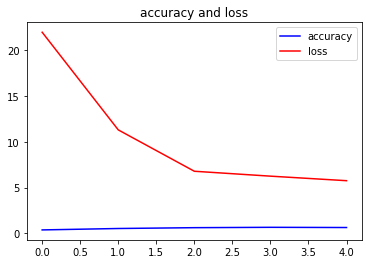

In [ ]:
import matplotlib.pyplot as plt

acc = history.history['acc']
loss = history.history['loss']
 
epochs = range(len(acc))
 
plt.plot(epochs, acc, 'b', label='accuracy')
plt.plot(epochs, loss, 'r', label='loss')
plt.title('accuracy and loss')
plt.legend()
  
plt.show()

## 새로 학습된 모델로 분류 실행

학습된 모델 파일을 읽어서 분류를 실행한다.


In [ ]:
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.applications import vgg16
from IPython.display import display
import numpy as np


def predict_custom_vgg16(model, filename) :

  image = load_img(filename)
  display(image)
  
  image = load_img(filename, target_size=(224, 224))

  image = img_to_array(image)
  image = image.reshape((1, 224, 224, 3))
  
  image = vgg16.preprocess_input(image)
  
  
  yhat = model.predict(image)
    

  # 최대 출력 인덱스를 구한다.
  idx=np.argmax(yhat[0])

  # 커스텀 레이블을 출력한다.
  print('%s (%.2f%%)' % (custom_labels[idx], yhat[0][idx]*100))
    
    
    
    


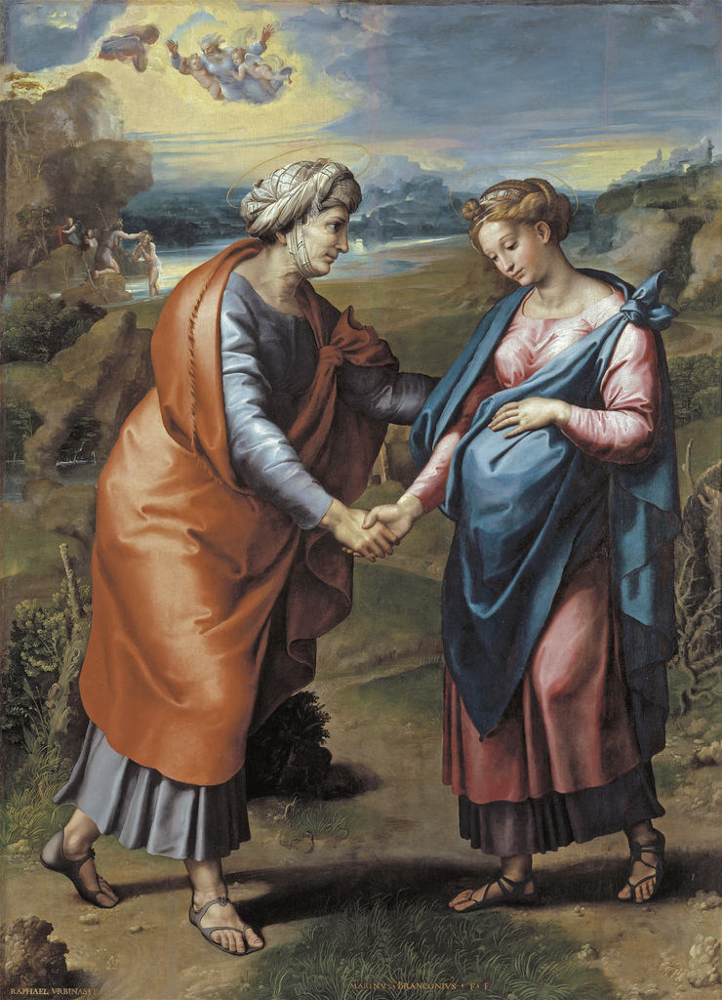

Raphael (100.00%)


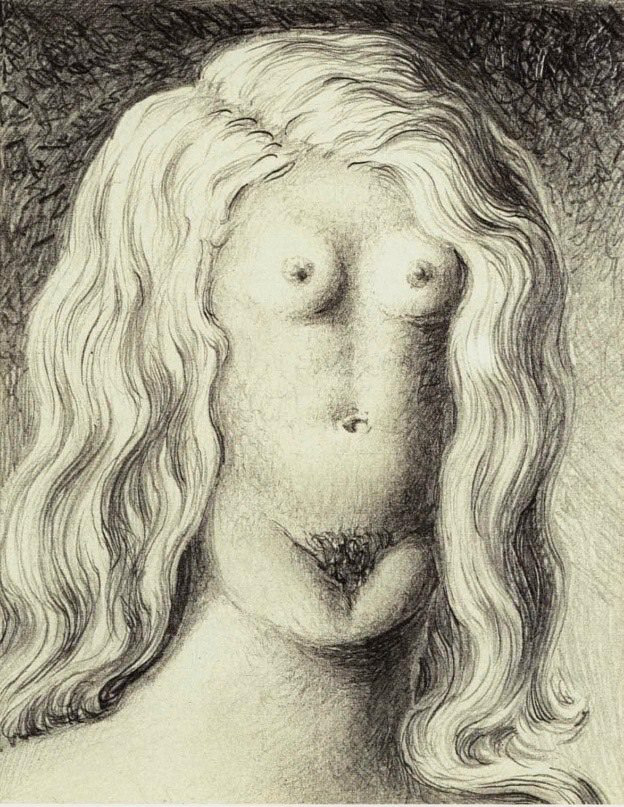

William_Turner (66.93%)


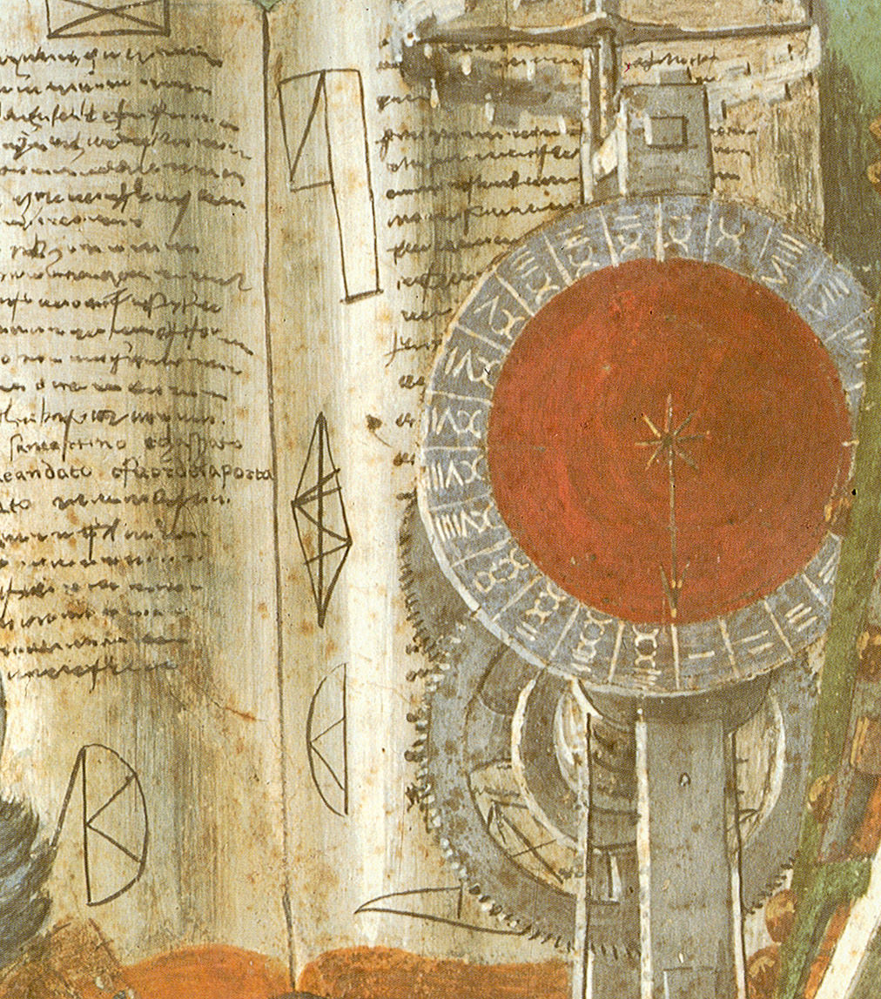

Vasiliy_Kandinskiy (100.00%)


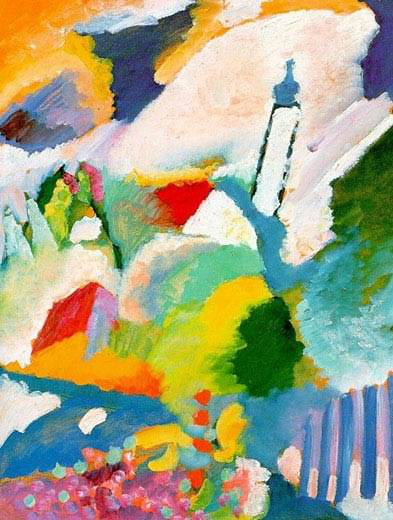

Vasiliy_Kandinskiy (100.00%)


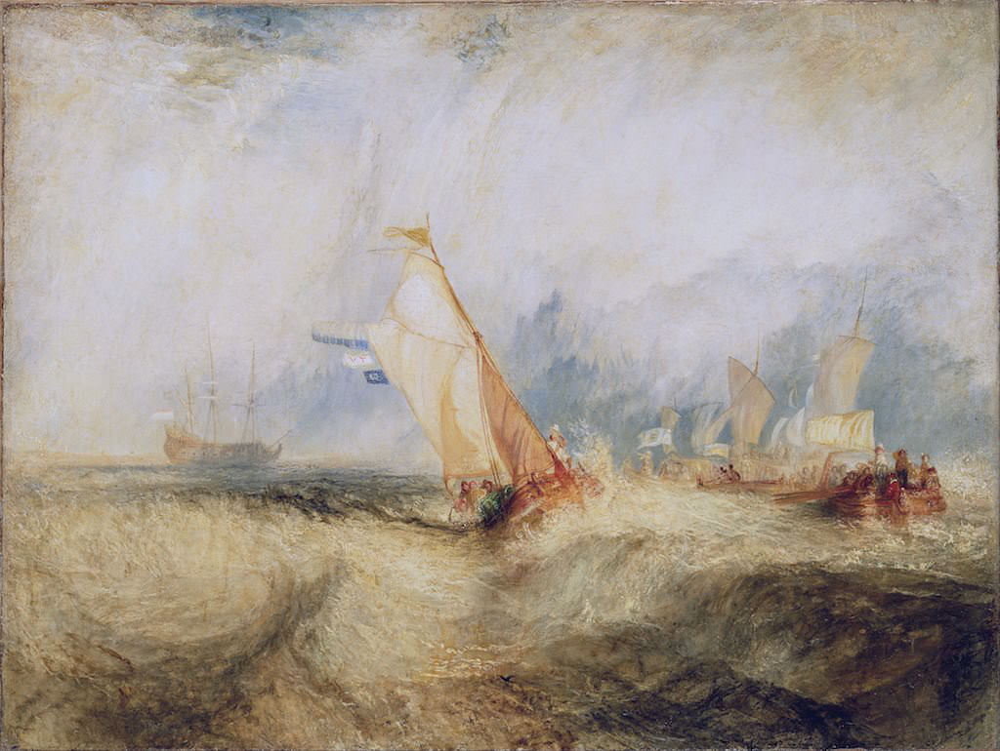

William_Turner (100.00%)


In [ ]:
from keras.models import load_model

model = load_model(vgg16_model_path)
  
files = [
    '/gdrive/My Drive/Colab Notebooks/11/소스코드(ipynb)/artist_image/test/Raphael/Raphael_100.jpg',
    '/gdrive/My Drive/Colab Notebooks/11/소스코드(ipynb)/artist_image/test/Rene_Magritte/Rene_Magritte_175.jpg',
    '/gdrive/My Drive/Colab Notebooks/11/소스코드(ipynb)/artist_image/test/Sandro_Botticelli/Sandro_Botticelli_145.jpg',
    '/gdrive/My Drive/Colab Notebooks/11/소스코드(ipynb)/artist_image/test/Vasiliy_Kandinskiy/Vasiliy_Kandinskiy_69.jpg',
    '/gdrive/My Drive/Colab Notebooks/11/소스코드(ipynb)/artist_image/test/William_Turner/William_Turner_57.jpg'
        ]

  
for file in files :
  predict_custom_vgg16(model, file)     
  

# ResNet으로 ImageNet 분류

## 분류 실행

실행 방법도 앞의 VGG16과 동일하다.

앞의 predict_vgg16()과 전체 구조는 완벽히 동일하다.

비교를 위해 커멘트를 전부 삭제하였고, 다른 부분만 커멘트를 달았다.

In [ ]:
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
#from keras.applications import vgg16
from keras.applications import resnet50
from IPython.display import display
import numpy as np


def predict_resnet20(model, filename) :

  image = load_img(filename)
  display(image)
  
  image = load_img(filename, target_size=(224, 224))

  
  image = img_to_array(image)

  image = image.reshape((1, 224, 224, 3))

#  image = vgg16.preprocess_input(image)
  image = resnet50.preprocess_input(image)
  
  
  yhat = model.predict(image)
    
    
#  label = vgg16.decode_predictions(yhat)
  label = resnet50.decode_predictions(yhat)

  label = label[0][0]
  
  print('%s (%.2f%%)' % (label[1], label[2]*100))
  

  


In [ ]:
  #from keras.applications import vgg16
from keras.applications import resnet50

# RestNet50 모델 불러오기
#model = vgg16.VGG16()
model = resnet50.ResNet50()

model.summary()

files = ['/gdrive/My Drive/Colab Notebooks/11/소스코드(ipynb)/artist_image/test/Raphael/Raphael_100.jpg',
    '/gdrive/My Drive/Colab Notebooks/11/소스코드(ipynb)/artist_image/test/Rene_Magritte/Rene_Magritte_175.jpg',
    '/gdrive/My Drive/Colab Notebooks/11/소스코드(ipynb)/artist_image/test/Sandro_Botticelli/Sandro_Botticelli_145.jpg',
    '/gdrive/My Drive/Colab Notebooks/11/소스코드(ipynb)/artist_image/test/Vasiliy_Kandinskiy/Vasiliy_Kandinskiy_69.jpg',
    '/gdrive/My Drive/Colab Notebooks/11/소스코드(ipynb)/artist_image/test/William_Turner/William_Turner_57.jpg'
        ]

for file in files :
#  predict_vgg16(model, file)  
    predict_resnet50(model, file)    

102973440/102967424 [==============================] - 0s 0us/step
Model: "resnet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_2[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
________________________

NameError: ignored

## 모델 새로 정의

내용은 vGG16과 동일하다.


In [ ]:
from keras.preprocessing.image import ImageDataGenerator
from keras import optimizers
from keras.models import Sequential
from keras.layers import Dropout, Flatten, Dense
from keras.models import Model
from keras import models
from keras import layers
from keras import optimizers
import keras.backend as K

K.clear_session()


#from keras.applications import vgg16
from keras.applications import resnet50

#conv_layers = vgg16.VGG16(weights='imagenet', include_top=False, input_shape=(image_size, image_size, 3))
conv_layers = resnet50.ResNet50(weights='imagenet', include_top=False, input_shape=(image_size, image_size, 3))
conv_layers.summary()

for layer in conv_layers.layers:
    layer.trainable = False


model = models.Sequential()

model.add(conv_layers)
 
model.add(layers.Flatten())
model.add(layers.Dense(1024, activation='relu'))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(class_num, activation='softmax'))

model.summary()


# vgg16_model_path = 'new_trained_from_vgg16.h5'
resnet50_model_path = 'new_trained_from_resnet50.h5'

# model.save(vgg16_model_path)
model.save(resnet50_model_path)

## 모델 학습

In [ ]:
from keras.models import load_model

#model = load_model(vgg16_model_path)
model = load_model(resnet50_model_path)


model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-4),
              metrics=['acc'])


history = model.fit_generator(
      train_generator,
      steps_per_epoch=train_generator.samples/train_generator.batch_size ,
      epochs=3,   # 원래 100
      validation_data=validation_generator,
      validation_steps=validation_generator.samples/validation_generator.batch_size,
      verbose=1)
 

#model.save(vgg16_model_path)
model.save(resnet50_model_path)

## 학습 중의 로스와 정확도 보기


In [ ]:
import matplotlib.pyplot as plt

acc = history.history['acc']
loss = history.history['loss']
 
epochs = range(len(acc))
 
plt.plot(epochs, acc, 'b', label='accuracy')
plt.plot(epochs, loss, 'r', label='loss')
plt.title('accuracy and loss')
plt.legend()
  
plt.show()

## 새로 학습된 모델로 분류 실행

학습된 모델 파일을 읽어서 분류를 실행한다.


In [ ]:
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
#from keras.applications import vgg16
from keras.applications import resnet50
from IPython.display import display
import numpy as np


def predict_custom_resnet50(model, filename) :

  image = load_img(filename)
  display(image)
  
  image = load_img(filename, target_size=(224, 224))

  image = img_to_array(image)
  image = image.reshape((1, 224, 224, 3))
  
#  image = vgg16.preprocess_input(image)
  image = resnet50.preprocess_input(image)
  
  
  yhat = model.predict(image)
    

  # 최대 출력 인덱스를 구한다.
  idx=np.argmax(yhat[0])

  # 커스텀 레이블을 출력한다.
  print('%s (%.2f%%)' % (custom_labels[idx], yhat[0][idx]*100))
    
    
    
    


In [ ]:
from keras.models import load_model

model = load_model(resnet50_model_path)
  
files = [
    '/gdrive/My Drive/Colab Notebooks/11/소스코드(ipynb)/artist_image/test/Raphael/Raphael_100.jpg',
    '/gdrive/My Drive/Colab Notebooks/11/소스코드(ipynb)/artist_image/test/Rene_Magritte/Rene_Magritte_175.jpg',
    '/gdrive/My Drive/Colab Notebooks/11/소스코드(ipynb)/artist_image/test/Sandro_Botticelli/Sandro_Botticelli_145.jpg',
    '/gdrive/My Drive/Colab Notebooks/11/소스코드(ipynb)/artist_image/test/Vasiliy_Kandinskiy/Vasiliy_Kandinskiy_69.jpg',
    '/gdrive/My Drive/Colab Notebooks/11/소스코드(ipynb)/artist_image/test/William_Turner/William_Turner_57.jpg'
        ]


  
for file in files :
  predict_custom_resnet50(model, file)     
  